In [1]:
import os, time, sys, gc

# please update this path accordingly
sys.path.append("../../DAS-reconstruction/scripts/")
os.environ['CUDA_VISIBLE_DEVICES'] = "3"

import h5py
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import pickle

from models import RandomFourierFeature
from datasets import DASDataset2DOnTheFly
from utils import clean_up, count_weights

device = torch.device('cuda')

## load data

(1000, 1500) (1000, 1500) (1000, 1500)
got 1000 channel and 1500 sample: (1000, 1500)


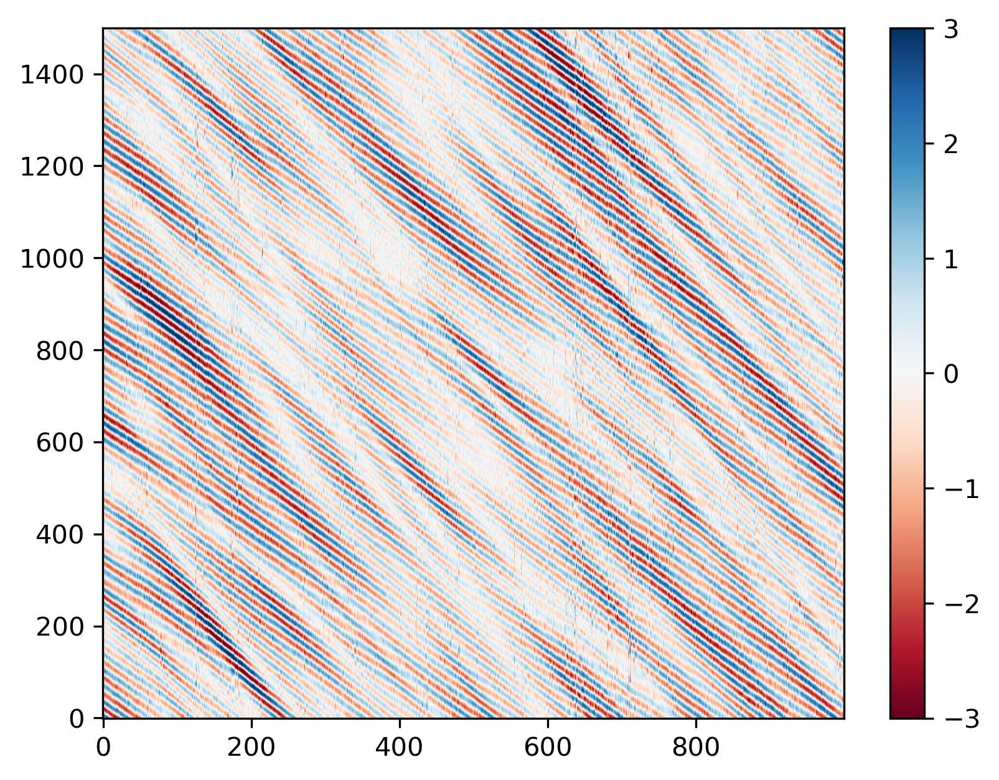

In [2]:
t_min = 0
t_max = 15000
t_dsp = 10
x_min = 4000
x_max = 5000
ff = h5py.File("../../datasets/reconstruction/continuous_test_KKFL-S_201i.h5", 'r')
data = ff['raw'][x_min:x_max, t_min:t_max:t_dsp]
reconstruct = ff['reconstruct'][x_min:x_max, t_min:t_max:t_dsp]
residual = ff['residual'][x_min:x_max, t_min:t_max:t_dsp]
ff.close()
print(data.shape, reconstruct.shape, residual.shape)

# data = df['/Acquisition/Raw[0]/RawData'][:1000, 1000:1500].T
# df.close()
vmax = 3
plt.figure(dpi=300)
plt.imshow(data.T, aspect = 'auto', cmap = 'RdBu', 
           vmax = vmax, vmin = -vmax, origin = 'lower')
plt.colorbar()

nc, ns = data.shape
print(f"got {nc} channel and {ns} sample: {data.shape}")

In [3]:
data -= np.mean(data, axis=-1, keepdims=True)
data /= np.max(np.abs(data), axis=-1, keepdims=True)
data = torch.Tensor(data)

in_x, in_t = torch.meshgrid(torch.arange(nc), torch.arange(ns))
T = in_t/(ns-1); X = in_x/(nc-1)
print(T.shape, X.shape)

torch.Size([1000, 1500]) torch.Size([1000, 1500])


/home/niyiyu/anaconda3/envs/seisbench/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [4]:
n_feature = 160

B = torch.Tensor(np.random.normal(scale = 10, size = (n_feature, 2)))

print("Initialize random fourier encoding matrix.")

d = data.reshape([-1, 1]).numpy()
index = np.abs(d) > 0.1
sum(index)/len(d)

datasetonthefly = DASDataset2DOnTheFly(B.to(device), 
                                    T.reshape([-1, 1])[index[:, 0]].to(device), 
                                    X.reshape([-1, 1])[index[:, 0]].to(device), 
                                    data.reshape([-1, 1])[index[:, 0]].to(device))

datasetonthefly_val = DASDataset2DOnTheFly(B.to(device), 
                                    T.reshape([-1, 1]).to(device), 
                                    X.reshape([-1, 1]).to(device), 
                                    data.reshape([-1, 1]).to(device))

data_loader = torch.utils.data.DataLoader(datasetonthefly, batch_size=4096*2, shuffle=True, num_workers=0)

Initialize random fourier encoding matrix.


## defind model and initize the weights

In [7]:
model = RandomFourierFeature(n_feature, n_layers=3)
for i in model.modules():
    if isinstance(i, torch.nn.Linear):
        i.weight.data.normal_(mean=0.0, std=0.1)
        i.bias.data.normal_(mean=0.0, std=0.1)

model.to(device);

print(f"The model have total {count_weights(model)} weights")

The model have total 128801 weights


In [8]:
optimizer = torch.optim.Adam(model.parameters(), lr = 3e-4)
loss_fn = torch.nn.MSELoss()

In [52]:
nepoch = 10
train_loss_log = []
t0 = time.time()
for t in range(nepoch):
    model.train()
    train_loss = 0
    
    for batch_id, batch in tqdm(enumerate(data_loader), total=len(data_loader)):
        pred = model(batch[0].cuda())
        loss = loss_fn(pred, batch[1].cuda())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    train_loss /= len(data_loader)
    
    train_loss_log.append(train_loss)
    print(f"{t}: train loss: %.6f"  % train_loss)
    if train_loss < 1e-2:
        break
print(time.time() - t0)

100%|██████████| 142/142 [01:32<00:00,  1.53it/s]


0: train loss: 0.146401


100%|██████████| 142/142 [01:32<00:00,  1.53it/s]


1: train loss: 0.111193


100%|██████████| 142/142 [01:32<00:00,  1.53it/s]


2: train loss: 0.061174


100%|██████████| 142/142 [01:33<00:00,  1.51it/s]


3: train loss: 0.027588


100%|██████████| 142/142 [01:33<00:00,  1.52it/s]


4: train loss: 0.018271


100%|██████████| 142/142 [01:33<00:00,  1.52it/s]


5: train loss: 0.014806


100%|██████████| 142/142 [01:33<00:00,  1.52it/s]


6: train loss: 0.013017


100%|██████████| 142/142 [01:33<00:00,  1.52it/s]


7: train loss: 0.012027


100%|██████████| 142/142 [01:33<00:00,  1.52it/s]


8: train loss: 0.011325


100%|██████████| 142/142 [01:33<00:00,  1.52it/s]

9: train loss: 0.010758
933.0651702880859


## validate

In [53]:
model.eval()

npiece = 10
split = np.split(np.arange(len(datasetonthefly_val)), npiece)
reconstruct = np.zeros(len(datasetonthefly_val))

for idx in tqdm(np.arange(npiece)):
    input_tensor = datasetonthefly_val[split[idx]][0].to(device)
    reconstruct[split[idx]] = model(input_tensor).detach().cpu().numpy()[:, 0]
    
reconstruct = reconstruct.reshape(data.shape)

del input_tensor
gc.collect()
torch.cuda.empty_cache()

100%|██████████| 10/10 [00:00<00:00, 145.19it/s]


In [46]:
np.save("../../datasets/reconstruction/RFFN_test_KKFL-S_5000_6000_10min", reconstruct)

([], [])

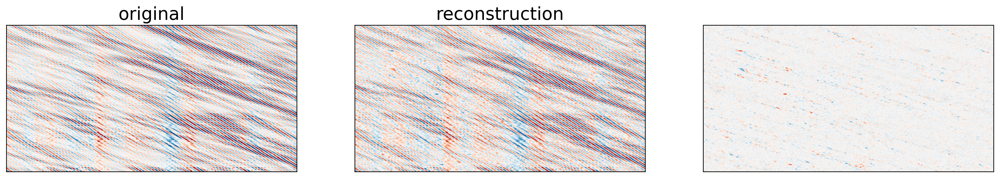

In [16]:
vmax = 1
plt.figure(figsize = (20, 3), dpi = 300)
plt.subplot(1,3,1)
plt.imshow(data, cmap = 'RdBu', aspect = 'auto', origin='lower', 
           vmin = -vmax, vmax = vmax)
plt.xticks([]); plt.yticks([])
plt.title("original", fontsize = 20)

plt.subplot(1,3,2)
plt.imshow(reconstruct, cmap = 'RdBu', aspect = 'auto', origin='lower', 
           vmin = -vmax, vmax = vmax)
plt.xticks([]); plt.yticks([])
plt.title("reconstruction", fontsize = 20)

plt.subplot(1,3,3)
plt.imshow(data - reconstruct, cmap = 'RdBu', aspect = 'auto', origin='lower', 
           vmin = -vmax, vmax = vmax)
plt.xticks([]); plt.yticks([])

# plt.savefig("/home/niyiyu/rff.png", bbox_inches = 'tight', dpi=300)

In [46]:
fs = 2.5
ns = data.shape[1]
t = np.arange(ns)/fs # time in s
frq = np.fft.rfftfreq(ns,d=1./fs)

In [47]:
cha = 2
ftr_raw = 20 * np.log10( (2/ns) * abs(np.fft.rfft(data[cha, :] * np.hamming(ns))) )
ftr_rec = 20 * np.log10( (2/ns) * abs(np.fft.rfft(reconstruct[cha, :] * np.hamming(ns))) )

In [9]:
plt.figure(figsize=(10, 5))
plt.plot(frq, ftr_raw, label='raw data')
plt.plot(frq, ftr_rec, label='reconstruction')
plt.plot(frq, np.abs(ftr_raw - ftr_rec), label='reconstruction')
plt.legend()
plt.xlim([0.01, 5.])
plt.xlabel("Frequency [Hz]")

## f-k (2D-FFT) transformation 

In [84]:
nnx = data.shape[0]
nns = data.shape[1]
dx = 9.57
dt = 1/2.5
freq = np.fft.fftshift(np.fft.fftfreq(nns, d=dt))
knum = np.fft.fftshift(np.fft.fftfreq(nnx, d=dx))

# Calculate the frequency-wavenumber spectrum
ft2_resc = np.fft.fftshift(np.fft.fft2(data))
ft2_resc = np.log10(abs(ft2_resc)) # this is not normalized

ft2_orig = np.fft.fftshift(np.fft.fft2(reconstruct))
ft2_orig = np.log10(abs(ft2_orig)) # this is not normalized

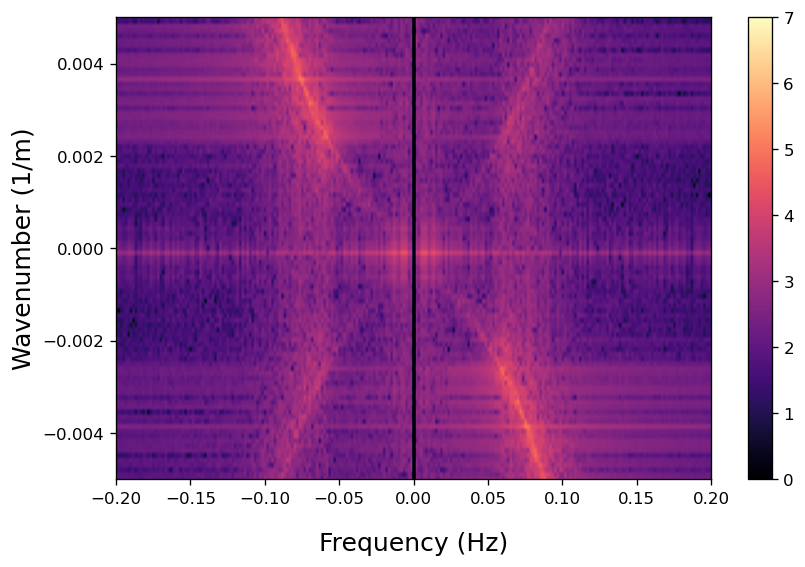

In [85]:
xlim = [-0.2, 0.2]; ylim = [-0.005,0.005]
plt.figure(figsize= (8, 5), dpi = 120)
plt.imshow(ft2_resc, cmap='magma', aspect = "auto", 
           extent=[min(freq),max(freq),min(knum),max(knum)], 
           vmin=0, vmax=7)
plt.ylabel("Wavenumber (1/m)", fontsize = 15)
plt.xlabel("Frequency (Hz)", labelpad = 15, fontsize = 15)
plt.xlim(xlim)
plt.ylim(ylim)
plt.colorbar()